# 🍕 Food Recognition Benchmark

# Problem Statement
Detecting & Segmenting various kinds of food from an image. For ex. Someone got into new restaurent and get a food that he has never seen, well our DL model is in rescue, so our DL model will help indentifying which food it is from the class our model is being trained on!    

<img src="https://i.imgur.com/zS2Nbf0.png" width="300" />


# Dataset
We will be using data from Food Recognition Challenge - A benchmark for image-based food recognition challange which is running since 2020.


https://www.aicrowd.com/challenges/food-recognition-benchmark-2022#datasets

We have a total of **39k training images** with **3k validation set** and **4k public-testing set**. All the images are RGB and annotations exist in **MS-COCO format**.

<img src="https://lh5.googleusercontent.com/iySoTCAHFoEKxjvzELzCJKbZaTG2TzMcjuBxAlBVGupjkpE_XI1xNPnE71UIBthTu9_fZ4A1tz-ArABpI0DD2ZeF87qHPccRogEezd-UbhkQgZcQBYCE1HMeDusaKtj8ClCWjw-p">

# Evaluation

The evaluation metrics is IOU aka. Intersection Over Union ( more about that later ).

The actualy metric is computed by averaging over all the precision and recall values for IOU which greater than 0.5.

https://www.aicrowd.com/challenges/food-recognition-challenge#evaluation-criteria


# What does this notebook contains?

1. Setting our Workspace 💼

2. Data Exploration 🧐
  - Reading Dataset
  - Data Visualisations

3. Image Visulisation 🖼️
   - Reading Images

4. Creating our Dataset 🔨
  - Fixing the Dataset
  - Creating our dataset

5. Creating our Model 🏭
   - Creating R-CNN Model
   - Setting up hyperparameters
   
6. Training the Model 🚂
  - Setting up Tensorboard
  - Start Training!

7. Evaluating the model 🧪
  - Evaluating our Model

8. Testing the Model 💯
  - Testing the Model

9. Submitting our predictions 📝



# Setting our Workspace 💼

In this section we will be downloading our dataset, unzipping it & downliading detectron2 library and importing all libraries that we will be using

## Downloading & Unzipping our Dataset

In [1]:
# # Login to AIcrowd
# !pip install aicrowd-cli > /dev/null
# !aicrowd login

In [2]:
# # List dataset for this challenge
# !aicrowd dataset list -c food-recognition-benchmark-2022

# # Download dataset
# !aicrowd dataset download -c food-recognition-benchmark-2022

In [3]:
# # Create data directory
# !mkdir -p data/ data/train data/val data/test
# !cp *test* data/test && cd data/test && echo "Extracting test dataset" && tar -xvf *test* > /dev/null
# !cp *val* data/val && cd data/val && echo "Extracting val dataset" &&  tar -xvf *val* > /dev/null
# !cp *train* data/train && cd data/train && echo "Extracting train dataset" &&  tar -xvf *train* > /dev/null

## Mount the Google Drive

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

So, the `data` directory is something like this:

<img src="https://images.aicrowd.com/uploads/ckeditor/pictures/674/content_carbon__3_.png" width="50%">

## Importing Necessary Libraries

In [5]:
# Making sure that we are using GPUs
!nvidia-smi

Thu Nov 30 15:37:27 2023       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.12             Driver Version: 535.104.12   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|


|   0  NVIDIA A10G                    On  | 00000000:00:1E.0 Off |                    0 |
|  0%   19C    P8              16W / 300W |      2MiB / 23028MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+----------------------+
                                                                                         
+---------------------------------------------------------------------------------------+
| Processes:                                                                            |
|  GPU   GI   CI        PID   Type   Process name                            GPU Memory |
|        ID   ID                                                             Usage      |
|=======================================================================================|
|  No running processes found                                                           |
+---------

In [6]:
# !pip install cython pyyaml==5.1
# !pip install -U pycocotools

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
# !pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.
#don't forget to restart the runtime

torch:  2.0 ; cuda:  2.0.1


In [7]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import cv2
import json
from tqdm.notebook import tqdm
import subprocess
import time
from pathlib import Path


# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.utils.visualizer import ColorMode
from detectron2.data.datasets import register_coco_instances
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.structures import Boxes, BoxMode
import pycocotools.mask as mask_util


# For reading annotations file
from pycocotools.coco import COCO

# utilities
from pprint import pprint # For beautiful print!
from collections import OrderedDict
import os

# For data visualisation
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
#from google.colab.patches import cv2_imshow

# Data Exploration 🧐

In this section we are going to read our dataset & doing some data visualisations

In [8]:
# Reading annotations.json
TRAIN_ANNOTATIONS_PATH = "data/train/annotations.json"
TRAIN_IMAGE_DIRECTIORY = "data/train/images/"

VAL_ANNOTATIONS_PATH = "data/val/annotations.json"
VAL_IMAGE_DIRECTIORY = "data/val/images/"

train_coco = COCO(TRAIN_ANNOTATIONS_PATH)

loading annotations into memory...
Done (t=3.71s)
creating index...
index created!


## Reading Data

In [9]:
# Reading the annotation files
with open(TRAIN_ANNOTATIONS_PATH) as f:
  train_annotations_data = json.load(f)

with open(VAL_ANNOTATIONS_PATH) as f:
  val_annotations_data = json.load(f)
train_annotations_data['annotations'][0]

{'id': 184123,
 'image_id': 131072,
 'category_id': 101246,
 'segmentation': [[169.0,
   379.5,
   130.0,
   374.5,
   112.0,
   363.5,
   94.5,
   340.0,
   61.5,
   213.0,
   61.5,
   188.0,
   70.5,
   168.0,
   87.0,
   152.5,
   103.0,
   143.5,
   123.0,
   139.5,
   185.0,
   118.5,
   226.0,
   90.5,
   249.0,
   87.5,
   309.0,
   88.5,
   339.0,
   110.5,
   350.5,
   125.00000000000001,
   354.5,
   155.0,
   382.5,
   231.0,
   383.5,
   277.0,
   360.0,
   303.5,
   327.0,
   331.5,
   308.0,
   343.5,
   216.0,
   373.5]],
 'area': 71393.0,
 'bbox': [61.5, 61.5, 318.0, 322.0],
 'iscrowd': 0}

## Data Format 🔍

Our COCO data format is something like this -

```
"info": {...},
"categories": [...],
"images": [...],
"annotations": [...],
```

In which categories is like this
```
[
  {'id': 2578,
  'name': 'water',
  'name_readable': 'Water',
  'supercategory': 'food'},
  {'id': 1157,
  'name': 'pear',
  'name_readable': 'Pear',
  'supercategory': 'food'},
  ...
  {'id': 1190,
  'name': 'peach',
  'name_readable': 'Peach',
  'supercategory': 'food'}
]
```

Info is empty ( not sure why )

images is like this

```
[
  {'file_name': '065537.jpg',
  'height': 464,
  'id': 65537,
  'width': 464},
  {'file_name': '065539.jpg',
  'height': 464,
  'id': 65539,
  'width': 464},
 ...
  {'file_name': '069900.jpg',
  'height': 391,
  'id': 69900,
  'width': 392},
]
```
Annotations is like this

```
{'area': 44320.0,
 'bbox': [86.5, 127.49999999999999, 286.0, 170.0],
 'category_id': 2578,
 'id': 102434,
 'image_id': 65537,
 'iscrowd': 0,
 'segmentation': [[235.99999999999997,
   372.5,
   169.0,
   372.5,
   ...
   368.5,
   264.0,
   371.5]]}
```


In [10]:
# Reading all classes
category_ids = train_coco.loadCats(train_coco.getCatIds())
category_names = [_["name_readable"] for _ in category_ids]

print("## Categories\n-", "\n- ".join(category_names))

## Categories
- Beetroot, steamed, without addition of salt
- bread_wholemeal
- jam
- water
- bread
- banana
- soft_cheese
- ham_raw
- hard_cheese
- cottage_cheese
- coffee
- fruit_mixed
- pancake
- tea
- salmon_smoked
- avocado
- spring_onion_scallion
- ristretto_with_caffeine
- ham_n_s
- egg
- bacon
- chips_french_fries
- juice_apple
- chicken
- tomato
- broccoli
- shrimp_prawn
- carrot
- chickpeas
- french_salad_dressing
- pasta_hornli_ch
- sauce_cream
- pasta_n_s
- tomato_sauce
- cheese_n_s
- pear
- cashew_nut
- almonds
- lentil_n_s
- mixed_vegetables
- peanut_butter
- apple
- blueberries
- cucumber
- yogurt
- butter
- mayonnaise
- soup
- wine_red
- wine_white
- green_bean_steamed_without_addition_of_salt
- sausage
- pizza_margherita_baked
- salami_ch
- mushroom
- tart_n_s
- rice
- white_coffee
- sunflower_seeds
- bell_pepper_red_raw
- zucchini
- asparagus
- tartar_sauce
- lye_pretzel_soft
- cucumber_pickled_ch
- curry_vegetarian
- soup_of_lentils_dahl_dhal
- salmon
- salt_cake_ch_

In [11]:
# Getting all categoriy with respective to their total images
no_images_per_category = {}

for n, i in enumerate(train_coco.getCatIds()):
  imgIds = train_coco.getImgIds(catIds=i)
  label = category_names[n]
  no_images_per_category[label] = len(imgIds)

img_info = pd.DataFrame(train_coco.loadImgs(train_coco.getImgIds()))
no_images_per_category = OrderedDict(sorted(no_images_per_category.items(), key=lambda x: -1*x[1]))

# Top 30 categories, based on number of images
i = 0
for k, v in no_images_per_category.items():
  print(k, v)
  i += 1
  if i > 30:
    break

water 4372
salad_leaf_salad_green 2807
tomato 2686
bread_white 2526
carrot 2193
butter 2180
bread_wholemeal 2030
coffee 2005
tea 1847
rice 1546
egg 1424
bread 1287
apple 1270
mixed_vegetables 1255
cucumber 1102
jam 1063
wine_red 936
cheese_n_s 918
banana 875
potato 854
bell_pepper_red_raw 806
bread_whole_wheat 782
hard_cheese 729
white_coffee 699
espresso 699
mixed_salad_chopped_without_sauce 659
avocado 647
tomato_sauce 623
zucchini 605
beef_n_s 572
strawberries 568


## Data Visualisations

In [12]:
fig = go.Figure([go.Bar(x=list(no_images_per_category.keys())[:50], y=list(no_images_per_category.values())[:50])])
fig.update_layout(
    title="No of Image per class",)

fig.show()

fig = go.Figure([go.Bar(x=list(no_images_per_category.keys())[50:200], y=list(no_images_per_category.values())[50:200])])
fig.update_layout(
    title="No of Image per class",)

fig.show()

fig = go.Figure([go.Bar(x=list(no_images_per_category.keys())[200:], y=list(no_images_per_category.values())[200:])])
fig.update_layout(
    title="No of Image per class",)

fig.show()

In [13]:
pprint(f"Average number of image per class : { sum(list(no_images_per_category.values())) / len(list(no_images_per_category.values())) }")
pprint(f"Highest number of image per class is : { list(no_images_per_category.keys())[0]} of { list(no_images_per_category.values())[0] }")
pprint(f"Lowest number of image per class is : Veggie Burger of { sorted(list(no_images_per_category.values()))[0] }")

'Average number of image per class : 289.9659442724458'
'Highest number of image per class is : water of 4372'
'Lowest number of image per class is : Veggie Burger of 45'


In [14]:
fig = go.Figure(data=[go.Pie(labels=list(no_images_per_category.keys())[:50], values=list(no_images_per_category.values())[:50],
                             hole=.3, textposition='inside', )], )
fig.update_layout(
    title="No of Image per class Top 50 ( In pie )",)
fig.show()

In [15]:
fig = go.Figure()
fig.add_trace(go.Histogram(x=img_info['height'],text='height'))
fig.add_trace(go.Histogram(x=img_info['width'],text='width'))

# Overlay both histograms
fig.update_layout(barmode='stack', title="Histogram of Image width & height",)


fig.show()

# Image Visulisation 🖼️

In this section  we are going to do image visualisations!

In [16]:
print(img_info)
print(img_info.describe())

           id   file_name  width  height
0      131072  131072.jpg    464     464
1      131087  131087.jpg    464     464
2      131088  131088.jpg    511     512
3      131094  131094.jpg    480     480
4      131096  131096.jpg    464     464
...       ...         ...    ...     ...
54387  131024  131024.jpg    512     910
54388  131033  131033.jpg    455     455
54389  131053  131053.jpg    391     390
54390  131066  131066.jpg    464     464
54391  131071  131071.jpg    464     464

[54392 rows x 4 columns]
                  id         width        height
count   54392.000000  54392.000000  54392.000000
mean   104833.339590    654.197676    656.477147
std     52019.147511    282.586766    288.826517
min      6316.000000    182.000000    183.000000
25%     63648.500000    464.000000    464.000000
50%    106975.500000    480.000000    480.000000
75%    151090.250000    853.000000    853.000000
max    186017.000000   4608.000000   4096.000000


In [17]:
len(train_annotations_data['annotations'][2]['segmentation']), len(train_annotations_data['annotations'][2]['bbox'])

(1, 4)

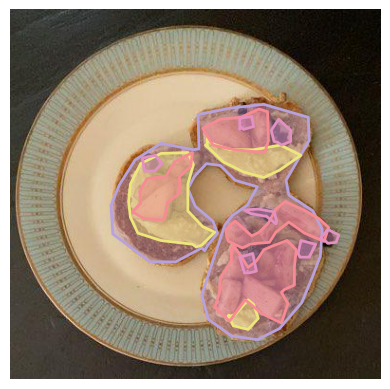

In [18]:
img_no = 20

annIds = train_coco.getAnnIds(imgIds=train_annotations_data['images'][img_no]['id'])
anns = train_coco.loadAnns(annIds)

# load and render the image
plt.imshow(plt.imread(TRAIN_IMAGE_DIRECTIORY+train_annotations_data['images'][img_no]['file_name']))
plt.axis('off')
# Render annotations on top of the image
train_coco.showAnns(anns)

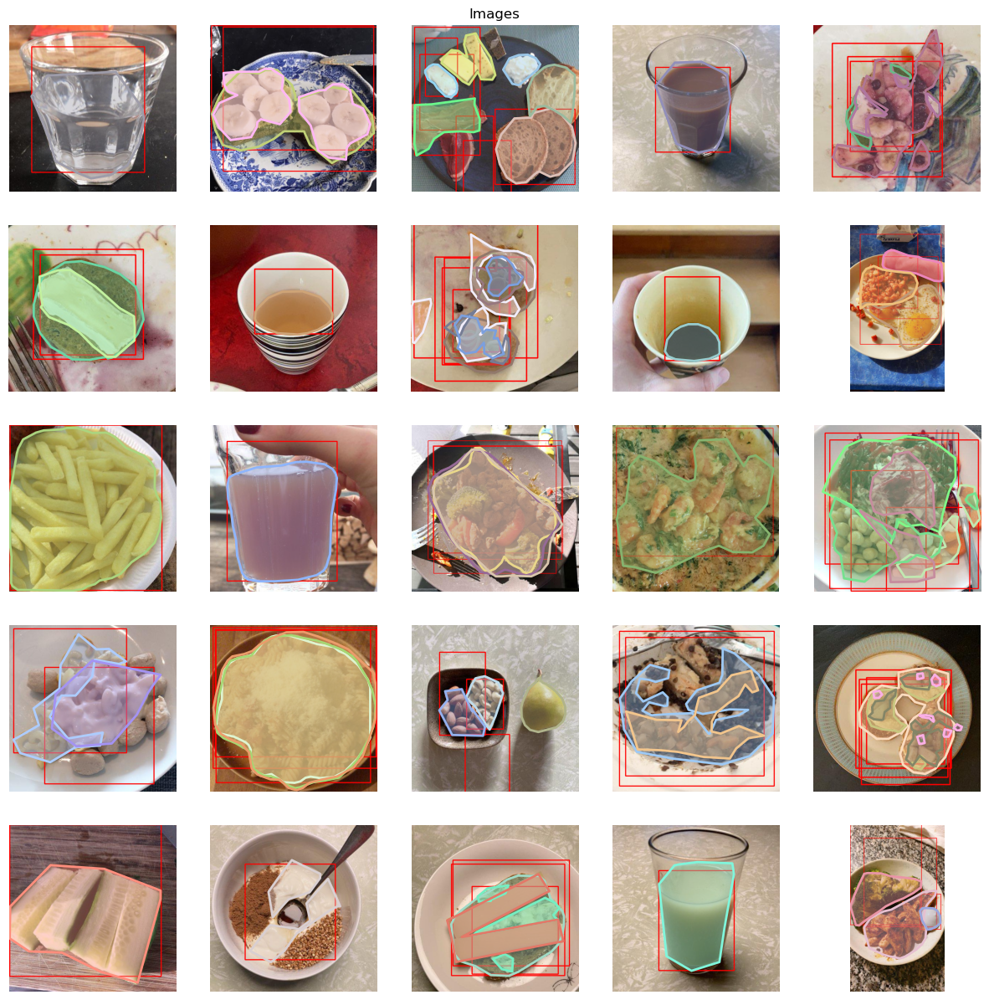

In [19]:
w, h = 15, 15 # Setting width and height of every image
rows, cols = 5, 5 # Setting the number of image rows & cols

fig = plt.figure(figsize=(15, 15)) # Making the figure with size

plt.title("Images")
plt.axis('off')

# Going thought every cell in rows and cols
for i in range(1, cols * rows+1):
  annIds = train_coco.getAnnIds(imgIds=img_info['id'][i])
  anns = train_coco.loadAnns(annIds)

  fig.add_subplot(rows, cols, i)

  # Show the image

  img = plt.imread(TRAIN_IMAGE_DIRECTIORY+img_info['file_name'][i])
  for i in anns:
    [x,y,w,h] = i['bbox']
    #create rectagle bbox of size given in dataset
    cv2.rectangle(img, (int(x), int(y)), (int(x+h), int(y+w)), (255,0,0), 2)
  plt.imshow(img)

  # Render annotations on top of the image
  train_coco.showAnns(anns)

  # Setting the axis off
  plt.axis("off")

# Showing the figure
plt.show()

# Data Argumentation

Here, we provide an example with fastai library, another library to use is [albumentations](https://github.com/albumentations-team/albumentations) which provides wide range of augmentations for computer vision tasks.

In [20]:
!pip install --upgrade fastai

In [21]:
from fastai.vision.core import *
from fastai.vision.utils import *
from fastai.vision.augment import *
from fastai.data.core import *
from fastai.data.transforms import *

In [22]:
images, lbl_bbox = get_annotations('data/train/annotations.json')

In [23]:
idx=20
coco_fn,bbox = 'data/train/images/'+images[idx],lbl_bbox[idx]

def _coco_bb(x):  return TensorBBox.create(bbox[0])
def _coco_lbl(x): return bbox[1]


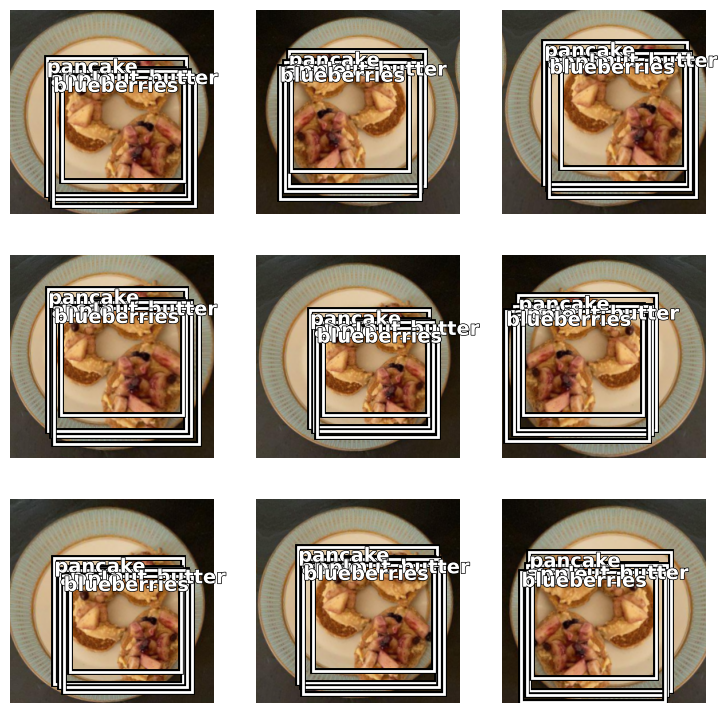

In [24]:
coco_dsrc = Datasets([coco_fn]*10, [PILImage.create, [_coco_bb,], [_coco_lbl, MultiCategorize(add_na=True)]], n_inp=1)
coco_tdl = TfmdDL(coco_dsrc, bs=9, after_item=[BBoxLabeler(), PointScaler(), ToTensor(), Resize(256)],
                  after_batch=[IntToFloatTensor(), *aug_transforms()])

coco_tdl.show_batch(max_n=9)

# Creating our Dataset 🔨

In this section we are goind to fix out dataset first ( because there is some issues with dataset ( size mismatch ) & creating our dataset to put into the model

## Fixing the Data

In [25]:
#example print
np.array(train_annotations_data['annotations'][2]['segmentation']).shape , np.array(train_annotations_data['annotations'][2]['bbox']).shape

((1, 26), (4,))

In [26]:
# Function for taking a annotation & directiory of images and returning new annoation json with fixed image size info
def fix_data(annotations, directiory, VERBOSE = False):
  for n, i in enumerate(tqdm((annotations['images']))):

      img = cv2.imread(directiory+i["file_name"])

      if img.shape[0] != i['height']:
          annotations['images'][n]['height'] = img.shape[0]
          if VERBOSE:
            print(i["file_name"])
            print(annotations['images'][n], img.shape)

      if img.shape[1] != i['width']:
          annotations['images'][n]['width'] = img.shape[1]
          if VERBOSE:
            print(i["file_name"])
            print(annotations['images'][n], img.shape)

  return annotations

#fix annotations for training dataset
train_annotations_data = fix_data(train_annotations_data, TRAIN_IMAGE_DIRECTIORY)

with open('data/train/new_ann.json', 'w') as f:
    json.dump(train_annotations_data, f)

#similar processing for validation data
val_annotations_data = fix_data(val_annotations_data, VAL_IMAGE_DIRECTIORY)

with open('data/val/new_ann.json', 'w') as f:
    json.dump(val_annotations_data, f)

  0%|          | 0/54392 [00:00<?, ?it/s]

  0%|          | 0/946 [00:00<?, ?it/s]

In [27]:
#mount the drive for logging and active submission
# from google.colab import drive
# drive.mount('/content/drive')

## Loading Dataset

Here comes the actual training part starting with first loading the datasets in coco format and registering them as instances

In [28]:
train_annotations_path = 'data/train/new_ann.json'
train_images_path = 'data/train/images'

val_annotations_path = 'data/val/new_ann.json'
val_images_path = 'data/val/images'

In [29]:
register_coco_instances("training_dataset", {},train_annotations_path, train_images_path)
register_coco_instances("validation_dataset", {},val_annotations_path, VAL_IMAGE_DIRECTIORY)

# Creating our Detectron2 Model 🏭

We are going to make an Faster R-CNN Model with ResNeXt 101 backbone using Detectron2 libarary, and setting up hyperpamaters to train our model. [Here at model_zoo page](https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md) you can find available pretrained models to start your traning from.

## Creating Mask R-CNN Model and Training on Our Dataset

we first load the configuration file for the model architecture, then load the pretrained model from model_zoo. Visit the model_zoo repo page for more details on configuration.

In [30]:
# Select your config from model_zoo, we have released pre-trained models for x101 and r50.

# Download available here: https://drive.google.com/drive/folders/10_JiikWP59vm2eGIxRenAXxvYLDjUOz0?usp=sharing (10k iters)
# Pre-trained with score of (0.030 AP, 0.050 AR)
# MODEL_ARCH = "COCO-InstanceSegmentation/mask_rcnn_X_101_32x8d_FPN_3x.yaml"

# Download available here: https://drive.google.com/drive/folders/1-LLFE8xFGOKkzPXF1DKF45c6O4W-38hu?usp=sharing (110k iters)
# Pre-trained with score of (0.082 AP, 0.128 AR)
MODEL_ARCH = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"

cfg = get_cfg()
# Check the model zoo and use any of the models ( from detectron2 github repo)

# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
# cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.merge_from_file(model_zoo.get_config_file(MODEL_ARCH))

cfg.DATASETS.TRAIN = ("training_dataset",)
cfg.DATASETS.TEST = ()

cfg.DATALOADER.NUM_WORKERS = 8

# Loading pre trained weights
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml")
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(MODEL_ARCH)

## Setting up hyperparameters

Modify the model configuration hyperparameters for our training

In [31]:
# No. of Batchs
cfg.SOLVER.IMS_PER_BATCH = 8    #for 16 GB GPU, reduce it to 2 for 12 GB GPU if you face CUDA memory error

# Learning Rate:
cfg.SOLVER.BASE_LR = 0.0025

# No of Interations
cfg.SOLVER.MAX_ITER = 5000

# Options: WarmupMultiStepLR, WarmupCosineLR.
# See detectron2/solver/build.py for definition.
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupMultiStepLR"

#save every 1000 steps
cfg.SOLVER.CHECKPOINT_PERIOD = 1000

# Images per batch (Batch Size)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256

# No of Categories(Classes) present
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 498



#Output directory
#### NOTE: You can also download pre-trained folder from Google Drive and upload in your drive; links are shared in above cell.
# cfg.OUTPUT_DIR = "/content/drive/MyDrive/logs_detectron2_x101"
cfg.OUTPUT_DIR = "logs_detectron2_r50"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [32]:
#set if to true if you want to resume training
RESUME = True
trainer = DefaultTrainer(cfg)

if RESUME:
  trainer.resume_or_load(resume=True)
else:
  trainer.resume_or_load(resume=False)

[11/30 15:44:08 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

# Training the Model 🚂

Finally training our model!

### Start Training!!!

In [33]:
trainer.train()

[11/30 15:44:19 d2.engine.train_loop]: Starting training from iteration 5000
[11/30 15:44:19 d2.engine.hooks]: Total training time: 0:00:00 (0:00:00 on hooks)
[11/30 15:44:19 d2.utils.events]:  iter: 5001       lr: N/A  max_mem: 363M


## Evaluating the Model on Validation Set!

In [34]:
# copy the trained model to content directory in colab
!cp 'logs_detectron2_r50/model_final.pth' model_final.pth

In [35]:
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.1

# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.WEIGHTS = 'model_final.pth'

evaluator = COCOEvaluator("validation_dataset", cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, "validation_dataset")
valResults = inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [11/30 15:44:25 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/30 15:44:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/30 15:44:25 d2.data.datasets.coco]: Loaded 946 images in COCO format from data/val/new_ann.json
[11/30 15:44:25 d2.data.build]: Distribution of instances among all 323 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
| beetroot-st.. | 5            | green_bean_.. | 1            | watermelon_.. | 5            |
| tuna_in_oil.. | 0            | sweet_potato  | 3            | country_fries | 3            |
| potato_gnoc.. | 1            | chips_frenc.. | 9            |   rosti_n_s   | 2            |
| vegetable_m.. | 1            | 

/opt/conda/envs/pytorch/lib/python3.10/site-packages/torch/functional.py:504: UserWarning:

torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1691816824431/work/aten/src/ATen/native/TensorShape.cpp:3483.)



[11/30 15:44:29 d2.evaluation.evaluator]: Inference done 11/946. Dataloading: 0.0009 s/iter. Inference: 0.0594 s/iter. Eval: 0.0040 s/iter. Total: 0.0643 s/iter. ETA=0:01:00
[11/30 15:44:34 d2.evaluation.evaluator]: Inference done 129/946. Dataloading: 0.0010 s/iter. Inference: 0.0369 s/iter. Eval: 0.0056 s/iter. Total: 0.0435 s/iter. ETA=0:00:35
[11/30 15:44:39 d2.evaluation.evaluator]: Inference done 256/946. Dataloading: 0.0011 s/iter. Inference: 0.0351 s/iter. Eval: 0.0052 s/iter. Total: 0.0414 s/iter. ETA=0:00:28
[11/30 15:44:44 d2.evaluation.evaluator]: Inference done 376/946. Dataloading: 0.0011 s/iter. Inference: 0.0350 s/iter. Eval: 0.0054 s/iter. Total: 0.0415 s/iter. ETA=0:00:23
[11/30 15:44:49 d2.evaluation.evaluator]: Inference done 497/946. Dataloading: 0.0011 s/iter. Inference: 0.0347 s/iter. Eval: 0.0057 s/iter. Total: 0.0415 s/iter. ETA=0:00:18
[11/30 15:44:54 d2.evaluation.evaluator]: Inference done 613/946. Dataloading: 0.0012 s/iter. Inference: 0.0345 s/iter. Eval: 

In [36]:
# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 498

cfg.DATASETS.TEST = ("validation_dataset", )
predictor = DefaultPredictor(cfg)

[11/30 15:45:26 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from model_final.pth ...


In [37]:
!pip3 install google-colab

  Using cached google-colab-1.0.0.tar.gz (72 kB)
  Preparing metadata (setup.py) ... done
  Using cached google_auth-1.4.2-py2.py3-none-any.whl (64 kB)
  Using cached ipykernel-4.6.1-py3-none-any.whl (104 kB)
  Using cached ipython-5.5.0-py3-none-any.whl (758 kB)
  Using cached notebook-5.2.2-py2.py3-none-any.whl (8.0 MB)
  Using cached six-1.12.0-py2.py3-none-any.whl (10 kB)
  Using cached pandas-0.24.2.tar.gz (11.8 MB)
  Preparing metadata (setup.py) ... -

error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [324 lines of output]
      /tmp/pip-install-alsy5ukx/pandas_4888029c79b34c92a490c7f687eab12f/setup.py:12: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
        import pkg_resources
      /tmp/pip-install-alsy5ukx/pandas_4888029c79b34c92a490c7f687eab12f/setup.py:50: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
        _CYTHON_INSTALLED = ver >= LooseVersion(min_cython_ver)
      Compiling pandas/_libs/algos.pyx because it changed.
      Compiling pandas/_libs/groupby.pyx because it changed.
      Compiling pandas/_libs/hashing.pyx because it changed.
      Compiling pandas/_libs/hashtable.pyx because it changed.
      Compiling pandas/_libs/index.pyx because it changed.
      Compiling pandas/_libs/indexing.pyx because it changed.
      Compil

In [47]:
val_metadata = MetadataCatalog.get("val_dataset")

# Sample image
image_id = '185392'
im = cv2.imread(f"data/val/images/{image_id}.jpg")

outputs = predictor(im)

v = Visualizer(im[:, :, ::-1],
                   metadata=val_metadata, 
                   scale=2,
                   instance_mode=ColorMode.IMAGE_BW
    )

out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# show the output image 
#out.get_image()[:, :, ::-1]

image = out.get_image()
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')  # Turn off axis numbers
plt.show()

TypeError: can't convert cuda:0 device type tensor to numpy. Use Tensor.cpu() to copy the tensor to host memory first.

# Create Class_to_category mapping to get correct predictions after inference.

In [40]:
#generate class category ids from detectron2 internal dictinary mappings
category_ids = sorted(train_coco.getCatIds())
categories = train_coco.loadCats(category_ids)

class_to_category = { int(class_id): int(category_id) for class_id, category_id in enumerate(category_ids) }

with open("class_to_category.json", "w") as fp:
  json.dump(class_to_category, fp)

# Quick Submission 💪

## Inference on the public test set
*   loading the model config and setting up related paths
*   running inference and generating json file for submission



In [41]:
#setting the paths and threshold
test_images_dir = "data/test/images"
output_filepath = "predictions_detectron2.json"

#path of trained model
model_path = 'model_final.pth'
# model_path = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

#threshold
threshold = 0.1

In [42]:
import os
import json
# import aicrowd_helpers
import importlib
import numpy as np
import cv2
import torch
from detectron2.engine import DefaultPredictor

from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.structures import Boxes, BoxMode
from detectron2.config import get_cfg
import pycocotools.mask as mask_util


class_to_category = {}
with open("class_to_category.json") as fp:
    class_to_category = json.load(fp)


def run():
    model_name = "model_zoo"
    model = importlib.import_module(f"detectron2.{model_name}")

    #set the config parameters, including the architecture which was previously used
    cfg = get_cfg()
    cfg.merge_from_file(model.get_config_file(MODEL_ARCH))
    cfg.MODEL.WEIGHTS = model_path

    #set the threshold
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = threshold   # set the testing threshold for this model
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 498

    cfg.MODEL.DEVICE = "cuda"
    predictor = DefaultPredictor(cfg)

    results = []
    for img_file in tqdm(os.listdir(test_images_dir)):
        filename = os.path.join(test_images_dir, img_file)
        img = cv2.imread(filename)
        prediction = predictor(img)

        instances = prediction["instances"]
        if len(instances) > 0:
            scores = instances.scores.tolist()
            classes = instances.pred_classes.tolist()
            bboxes = BoxMode.convert(
                instances.pred_boxes.tensor.cpu(),
                BoxMode.XYXY_ABS,
                BoxMode.XYWH_ABS,
            ).tolist()

            masks = []
            if instances.has("pred_masks"):
                for mask in instances.pred_masks.cpu():
                    _mask = mask_util.encode(np.array(mask[:, :, None], order="F", dtype="uint8"))[0]
                    _mask["counts"] = _mask["counts"].decode("utf-8")
                    masks.append(_mask)

            for idx in range(len(instances)):
                category_id = class_to_category[str(classes[idx])] # json converts int keys to str
                output = {
                    "image_id": int(img_file.split(".")[0]),
                    "category_id": category_id,
                    "bbox": bboxes[idx],
                    "score": scores[idx],
                }
                if len(masks) > 0:
                    output["segmentation"] = masks[idx]
                results.append(output)

        with open(output_filepath, "w") as fp:
            json.dump(results, fp)


#run the inference which generates predictions as json file
run()

[11/30 16:02:18 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from model_final.pth ...


  0%|          | 0/2819 [00:00<?, ?it/s]

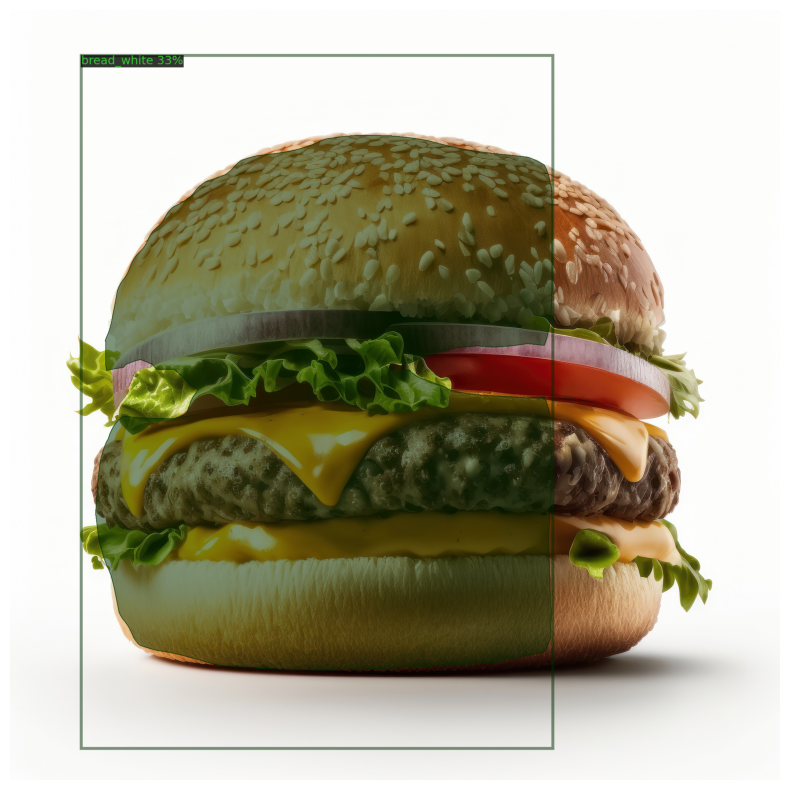

['white bread']

In [55]:
def predict_and_visualize(image_path, predictor, metadata):
    img = cv2.imread(image_path)
    outputs = predictor(img)

    v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=1.0)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    annotated_img = cv2.cvtColor(out.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 10))
    plt.imshow(annotated_img)
    plt.axis('off')
    plt.show()

    # Extracting detected food items
    classes = outputs["instances"].pred_classes.cpu().numpy()
    class_names = [metadata.thing_classes[i] for i in classes]

    # Format the food item names (e.g., 'bread_wheat' to 'wheat bread')
    formatted_names = [' '.join(name.split('_')[::-1]) for name in class_names]
    return formatted_names

# Example Usage
image_path = "data/burger.jpeg" # replace with your image path
metadata = MetadataCatalog.get("training_dataset") # Replace with your metadata
predict_and_visualize(image_path, predictor, metadata)

In [68]:
import streamlit as st
import requests
import tempfile
    
def get_calorie_info(food_item):
    API_URL = f'https://api.api-ninjas.com/v1/nutrition?query={food_item}'
    API_KEY = 't10Uf0U2FaPHov7a1++GSw==1iTzjwBudd4SFs8n'

    headers = {'X-Api-Key': API_KEY}
    response = requests.get(API_URL, headers=headers)

    if response.status_code == 200:
        data = response.json()
        # Aggregate the calorie and macronutrient information
        total_calories = sum(item['calories'] for item in data)
        macros = {
            'protein_g': sum(item['protein_g'] for item in data),
            'fat_total_g': sum(item['fat_total_g'] for item in data),
            'carbohydrates_total_g': sum(item['carbohydrates_total_g'] for item in data)
        }
        return total_calories, macros
    else:
        print(f"Error: {response.status_code}, {response.text}")
        return "Calorie info not available", None

def save_uploaded_file(uploaded_file):
    try:
        # Create a temporary directory
        with tempfile.TemporaryDirectory() as temp_dir:
            # Form a file path
            file_path = os.path.join(temp_dir, uploaded_file.name)

            # Write the uploaded file to the new file path
            with open(file_path, "wb") as f:
                f.write(uploaded_file.getbuffer())

            return file_path
    except Exception as e:
        print(f"Error saving uploaded file: {e}")
        return None

# Main App
def main():
    st.title("Food Item Detector and Calorie Estimator")

    st.write("## Description")
    st.write("This app detects food items in an image and provides an estimated calorie count.")

    st.write("## Steps")
    st.write("1. Upload an image of the food.")
    st.write("2. Wait for the app to detect the food items.")
    st.write("3. View the detected items and their estimated calorie content.")

    uploaded_file = st.file_uploader("Upload an image", type=["jpg", "jpeg", "png"])
    if uploaded_file is not None:
        st.image(uploaded_file, caption='Uploaded Image.', use_column_width=True)
        st.write("Detecting...")
        
        # Convert the file to an image and predict (Adjust this part based on your actual prediction code)
        image_path = save_uploaded_file(uploaded_file)
        detected_items = predict_and_visualize(image_path, predictor, metadata)

        for item in detected_items:
            calories, macros = get_calorie_info(item)
            st.write(f" - {item}: {calories} calories")
            if macros:
                st.write(f"   - Protein: {macros['protein_g']}g, Fat: {macros['fat_total_g']}g, Carbs: {macros['carbohydrates_total_g']}g")

if __name__ == "__main__":
    main()


# Food Item Detector and Calorie Estimator

## Description

This app detects food items in an image and provides an estimated calorie count.

## Steps

1. Upload an image of the food.

2. Wait for the app to detect the food items.

3. View the detected items and their estimated calorie content.

In [ ]:
%